In [1]:
#imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import seaborn as sns
from scipy import stats
import graphviz
from graphviz import Graph

#functions
import wrangle as w
import explore as exp
import model as m


warnings.filterwarnings("ignore")

#evaluate
import sklearn.preprocessing

#feature engineering
from sklearn.cluster import KMeans
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.linear_model import LogisticRegression
from sklearn.feature_selection import RFE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MultiLabelBinarizer

# modeling methods
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_fscore_support

In [2]:
aac = w.get_aac()

In [11]:
aac.head(2).T

,0,1
Animal ID,A794011,A776359
Name,Chunk,Gizmo
DateTime,05/08/2019 06:20:00 PM,07/18/2018 04:02:00 PM
MonthYear,05/08/2019 06:20:00 PM,07/18/2018 04:02:00 PM
Found Location,NaN,NaN
Intake Type,NaN,NaN
Intake Condition,NaN,NaN
Animal Type,Cat,Dog
Sex upon Intake,NaN,NaN
Age upon Intake,NaN,NaN


In [3]:
df = w.clean_aac001(aac)

In [4]:
df.head(2)

,animal_id,date,breed,color,dob,outcome_age,elderly,full_grown,youngins,neutered_male,intact_male,neutered,is_male,is_Dog,is_pitbull,is_black,adopted
0,A663201,2013-10-01,Pit Bull Mix,Brown/White,09/14/2011,2,0,1,0,1,0,1,1,1,1,0,0
1,A661933,2013-10-01,Domestic Shorthair Mix,Blue Tabby,09/19/2003,10,1,0,0,0,0,1,0,0,0,0,0


In [5]:
# Creating list of multi-labels
breed_list = df.breed.apply(lambda x: list(x.split("/")))

# Converting it into dataframe and working on it seperately
breed_df =pd.DataFrame({"breed":breed_list})
breed_df.head()

,breed
0,[Pit Bull Mix]
1,[Domestic Shorthair Mix]
2,[Domestic Shorthair]
3,[Domestic Shorthair Mix]
4,[American Bulldog Mix]


In [6]:
# instantiating MultiLabelBinarizer: BREED
mlb = MultiLabelBinarizer()
breed_encoded = pd.DataFrame(mlb.fit_transform(breed_df["breed"]),columns=mlb.classes_)
breed_encoded.head()

,Abyssinian,Abyssinian Mix,Affenpinscher,Affenpinscher Mix,Afghan Hound,Airedale Terrier,Airedale Terrier Mix,Akbash Mix,Akita,Akita Mix,...,West Highland Mix,Whippet,Whippet Mix,Wire Hair Fox Terrier,Wire Hair Fox Terrier Mix,Wirehaired Pointing Griffon,Wirehaired Pointing Griffon Mix,Wolf Hybrid Mix,Yorkshire Terrier,Yorkshire Terrier Mix
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [7]:
# Creating list of multi-labels
color_list = df.color.apply(lambda x: list(x.split("/")))

# Converting it into dataframe and working on it seperately
color_df =pd.DataFrame({"color":color_list})
color_df.head()

,color
0,"[Brown, White]"
1,[Blue Tabby]
2,"[Blue, White]"
3,[Orange Tabby]
4,"[White, Brown Brindle]"


In [8]:
# instantiating MultiLabelBinarizer: COLOR
mlb = MultiLabelBinarizer()
color_encoded = pd.DataFrame(mlb.fit_transform(color_df["color"]),columns=mlb.classes_)
color_encoded.head()

,Agouti,Apricot,Black,Black Brindle,Black Smoke,Black Tabby,Black Tiger,Blue,Blue Cream,Blue Merle,...,Silver Lynx Point,Silver Tabby,Tan,Torbie,Tortie,Tortie Point,Tricolor,White,Yellow,Yellow Brindle
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0


In [9]:
pd.concat([df, breed_encoded, color_encoded], axis =1)

,animal_id,date,breed,color,dob,outcome_age,elderly,full_grown,youngins,neutered_male,...,Silver Lynx Point,Silver Tabby,Tan,Torbie,Tortie,Tortie Point,Tricolor,White,Yellow,Yellow Brindle
0,A663201,2013-10-01,Pit Bull Mix,Brown/White,09/14/2011,2,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
1,A661933,2013-10-01,Domestic Shorthair Mix,Blue Tabby,09/19/2003,10,1,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,A660634,2013-10-01,Domestic Shorthair,Blue/White,07/09/2013,0,0,0,1,0,...,0,0,0,0,0,0,0,1,0,0
3,A664271,2013-10-01,Domestic Shorthair Mix,Orange Tabby,09/24/2013,0,0,0,1,0,...,0,0,0,0,0,0,0,0,0,0
4,A663546,2013-10-01,American Bulldog Mix,White/Brown Brindle,09/20/2011,2,0,1,0,1,...,0,0,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87942,A829552,2021-03-03,German Shepherd,Tan/Black,02/13/2020,1,0,0,1,0,...,0,0,1,0,0,0,0,0,0,0
87943,A822366,2021-03-03,Domestic Shorthair,Black/White,11/24/2017,3,0,1,0,0,...,0,0,0,0,0,0,0,1,0,0
87944,A829483,2021-03-03,Labrador Retriever/German Shepherd,Tan/White,02/11/2020,1,0,0,1,1,...,0,0,1,0,0,0,0,1,0,0
87945,A829868,2021-03-03,Beagle/Labrador Retriever,Tricolor,02/25/2020,1,0,0,1,1,...,0,0,0,0,0,0,1,0,0,0


# Test new function

In [2]:
aac = w.get_aac()

In [3]:
aac.head(2).T

,0,1
Animal ID,A794011,A776359
Name,Chunk,Gizmo
DateTime,05/08/2019 06:20:00 PM,07/18/2018 04:02:00 PM
MonthYear,05/08/2019 06:20:00 PM,07/18/2018 04:02:00 PM
Found Location,NaN,NaN
Intake Type,NaN,NaN
Intake Condition,NaN,NaN
Animal Type,Cat,Dog
Sex upon Intake,NaN,NaN
Age upon Intake,NaN,NaN


In [4]:
df = w.clean_aac(aac)

In [5]:
df.head(2).T

animal_id,A663201,A661933
date,2013-10-01,2013-10-01
breed,Pit Bull Mix,Domestic Shorthair Mix
color,Brown/White,Blue Tabby
dob,09/14/2011,09/19/2003
outcome_age,2,10
elderly,0,1
full_grown,1,0
youngins,0,0
neutered_male,1,0
intact_male,0,0


In [6]:
df = w.encode_df(df)

In [7]:
df.head(2).T

,0,1
date,2013-10-01,2013-10-01
breed,Pit Bull Mix,Domestic Shorthair Mix
color,Brown/White,Blue Tabby
dob,09/14/2011,09/19/2003
outcome_age,2,10
...,...,...
Tortie Point,0,0
Tricolor,0,0
White,1,0
Yellow,0,0


<AxesSubplot:xlabel='count', ylabel='color'>

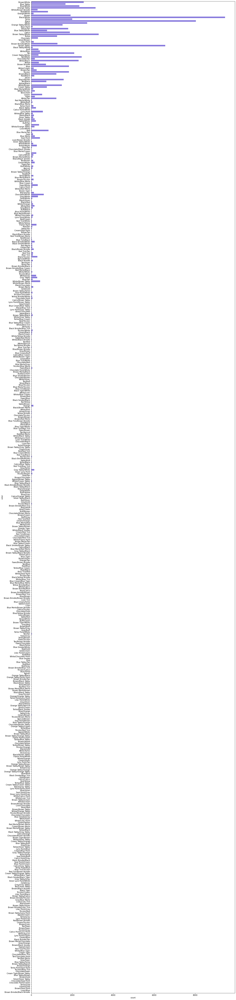

In [12]:
f, ax = plt.subplots(figsize=(20, 100))
sns.countplot(y="color", data=df, color="mediumslateblue")

<AxesSubplot:xlabel='count', ylabel='color'>

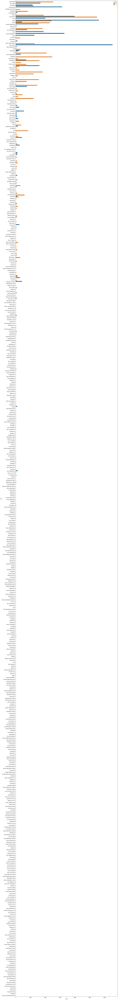

In [9]:
f, ax = plt.subplots(figsize=(20, 200))
sns.countplot(y="color", data=df, hue="is_Dog")

<AxesSubplot:xlabel='count', ylabel='color'>

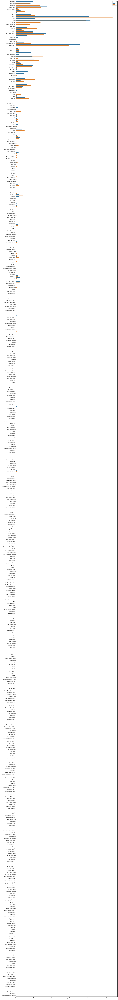

In [11]:
f, ax = plt.subplots(figsize=(20, 200))
sns.countplot(y="color", data=df, hue="adopted")

<AxesSubplot:xlabel='count', ylabel='breed'>

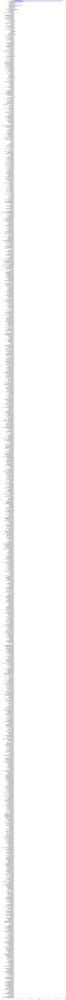

In [13]:
f, ax = plt.subplots(figsize=(20, 400))
sns.countplot(y="breed", data=df, color="mediumslateblue")

<AxesSubplot:xlabel='count', ylabel='breed'>

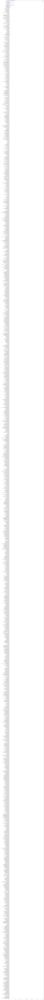

In [14]:
f, ax = plt.subplots(figsize=(20, 600))
sns.countplot(y="breed", data=df, hue="is_Dog", color="mediumslateblue")

<AxesSubplot:xlabel='count', ylabel='breed'>

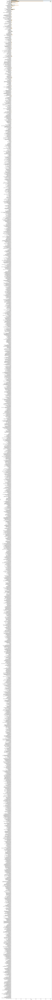

In [16]:
f, ax = plt.subplots(figsize=(20, 500))
sns.countplot(y="breed", data=df, hue="adopted")

In [17]:
# split data

train, validate, test, X_train, y_train, X_validate, y_validate, X_test, y_test = w.split_df(df, "adopted", 3210)

In [18]:
train.shape, validate.shape, test.shape, X_train.shape, y_train.shape, X_validate.shape, y_validate.shape, X_test.shape, y_test.shape

((49249, 527),
 (21108, 527),
 (17590, 527),
 (49249, 526),
 (49249,),
 (21108, 526),
 (21108,),
 (17590, 526),
 (17590,))

In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 87947 entries, 0 to 87946
Columns: 527 entries, date to Yellow Brindle
dtypes: int64(522), object(4), uint8(1)
memory usage: 353.0+ MB


In [20]:
train.columns.to_list()

['date',
 'breed',
 'color',
 'dob',
 'outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_pitbull',
 'is_black',
 'adopted',
 'Abyssinian',
 'Abyssinian Mix',
 'Affenpinscher',
 'Affenpinscher Mix',
 'Afghan Hound',
 'Airedale Terrier',
 'Airedale Terrier Mix',
 'Akbash Mix',
 'Akita',
 'Akita Mix',
 'Alaskan Husky',
 'Alaskan Husky Mix',
 'Alaskan Klee Kai',
 'Alaskan Malamute',
 'Alaskan Malamute Mix',
 'American Bulldog',
 'American Bulldog Mix',
 'American Curl Shorthair',
 'American Curl Shorthair Mix',
 'American Eskimo',
 'American Eskimo Mix',
 'American Foxhound',
 'American Foxhound Mix',
 'American Pit Bull Terrier',
 'American Pit Bull Terrier Mix',
 'American Shorthair',
 'American Shorthair Mix',
 'American Staffordshire Terrier',
 'American Staffordshire Terrier Mix',
 'American Wirehair Mix',
 'Anatol Shepherd',
 'Anatol Shepherd Mix',
 'Angora Mix',
 'Australian Cattle Dog',
 'Australian Catt

# Hypotheses Testing

hypothesis5: Orange tabbies are least adopted

In [21]:
null_hypothesis = "Tabby status and adoption rates are INDEPENDENT."
alternative_hypothesis = "There is a relationship between tabby status and if they get adopted."
confidence_level = .99
a = 1 - confidence_level 

In [22]:
observed7 = pd.crosstab(train['Orange Tabby'], train.adopted)
observed7

adopted,0,1
Orange Tabby,,
0,21022,25556
1,1359,1312


In [23]:
chi2, p, degf, expected = stats.chi2_contingency(observed7)

if p < a:
    print(f"We reject the null hypothesis: {null_hypothesis}")
    print(f"Therefore: {alternative_hypothesis}")
else:
    print(f"We fail to reject the null, therefore: {null_hypothesis}")
p

We reject the null hypothesis: Tabby status and adoption rates are INDEPENDENT.
Therefore: There is a relationship between tabby status and if they get adopted.


7.424101583582255e-09

In [24]:
# remove object types from splits

X_train_lim = X_train.iloc[:, 4:]
X_validate_lim = X_validate.iloc[:, 4:]
X_test_lim = X_test.iloc[:, 4:]

In [26]:
X_train_lim.head(2)

,outcome_age,elderly,full_grown,youngins,neutered_male,intact_male,neutered,is_male,is_Dog,is_pitbull,...,Silver Lynx Point,Silver Tabby,Tan,Torbie,Tortie,Tortie Point,Tricolor,White,Yellow,Yellow Brindle
16334,2,0,1,0,1,0,1,1,1,1,...,0,0,0,0,0,0,0,1,0,0
43947,2,0,1,0,1,0,1,1,1,0,...,0,0,0,0,0,0,1,0,0,0


# Feature Importance

In [28]:
f_feature = exp.select_kbest(X_train_lim, y_train, 3)
f_feature

['neutered_male', 'intact_male', 'neutered']

In [29]:
rfe_feature = exp.rfe(X_train_lim, y_train, 3)
rfe_feature 

['neutered', 'Lhasa Apso Mix', 'Shih Tzu Mix']

In [30]:
f_feature = exp.select_kbest(X_train_lim, y_train, 10)
f_feature

['outcome_age',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_Dog',
 'Domestic Shorthair Mix',
 'German Shepherd',
 'Labrador Retriever Mix',
 'Brown Tabby',
 'Tan']

In [31]:
rfe_feature = exp.rfe(X_train_lim, y_train, 10)
rfe_feature 

['neutered',
 'American Foxhound Mix',
 'Boston Terrier Mix',
 'Chinese Crested',
 'Cocker Spaniel',
 'French Bulldog Mix',
 'Greater Swiss Mountain Dog Mix',
 'Lhasa Apso Mix',
 'Pug Mix',
 'Shih Tzu Mix']

In [32]:
f_feature = exp.select_kbest(X_train_lim, y_train, 20)
f_feature

['outcome_age',
 'elderly',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_Dog',
 'is_black',
 'Australian Cattle Dog Mix',
 'Domestic Shorthair',
 'Domestic Shorthair Mix',
 'German Shepherd',
 'German Shepherd Mix',
 'Labrador Retriever',
 'Labrador Retriever Mix',
 'Shih Tzu Mix',
 'Brown',
 'Brown Tabby',
 'Gray Tabby',
 'Tan',
 'Tricolor']

In [33]:
rfe_feature = exp.rfe(X_train_lim, y_train, 20)
rfe_feature 

['youngins',
 'neutered',
 'American Foxhound Mix',
 'Australian Terrier Mix',
 'Basenji Mix',
 'Boston Terrier Mix',
 'Chinese Crested',
 'Cocker Spaniel',
 'Doberman Pinsch Mix',
 'English Springer Spaniel',
 'French Bulldog Mix',
 'Greater Swiss Mountain Dog Mix',
 'Lhasa Apso Mix',
 'Patterdale Terr Mix',
 'Pug Mix',
 'Scottish Terrier',
 'Shih Tzu Mix',
 'St. Bernard Smooth Coat',
 'Vizsla Mix',
 'Liver Tick']

In [34]:
f_feature = exp.select_kbest(X_train_lim, y_train, 50)
f_feature

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_black',
 'Australian Cattle Dog',
 'Australian Cattle Dog Mix',
 'Black Mouth Cur Mix',
 'Border Collie',
 'Border Collie Mix',
 'Boxer',
 'Cairn Terrier Mix',
 'Catahoula Mix',
 'Chihuahua Shorthair',
 'Chihuahua Shorthair Mix',
 'Dachshund Mix',
 'Domestic Medium Hair Mix',
 'Domestic Shorthair',
 'Domestic Shorthair Mix',
 'German Shepherd',
 'German Shepherd Mix',
 'Jack Russell Terrier Mix',
 'Labrador Retriever',
 'Labrador Retriever Mix',
 'Lhasa Apso',
 'Lhasa Apso Mix',
 'Pointer',
 'Shih Tzu',
 'Shih Tzu Mix',
 'Siberian Husky',
 'Siberian Husky Mix',
 'Staffordshire Mix',
 'Black Tabby',
 'Brown',
 'Brown Brindle',
 'Brown Tabby',
 'Gray',
 'Gray Tabby',
 'Orange',
 'Orange Tabby',
 'Red',
 'Tan',
 'Tortie',
 'Tricolor',
 'White']

In [35]:
rfe_feature = exp.rfe(X_train_lim, y_train, 50)
rfe_feature 

['youngins',
 'neutered',
 'Akbash Mix',
 'American Foxhound Mix',
 'Australian Terrier Mix',
 'Basenji Mix',
 'Belgian Malinois Mix',
 'Belgian Tervuren',
 'Bluetick Hound',
 'Boston Terrier Mix',
 'Bull Terrier Mix',
 'Carolina Dog',
 'Chinese Crested',
 'Cocker Spaniel',
 'Dalmatian',
 'Doberman Pinsch Mix',
 'English Coonhound Mix',
 'English Shepherd Mix',
 'English Springer Spaniel',
 'French Bulldog Mix',
 'Glen Of Imaal Mix',
 'Greater Swiss Mountain Dog Mix',
 'Landseer Mix',
 'Lhasa Apso',
 'Lhasa Apso Mix',
 'Munchkin Longhair Mix',
 'Neapolitan Mastiff',
 'Norwich Terrier',
 'Parson Russell Terrier Mix',
 'Patterdale Terr Mix',
 'Pekingese',
 'Pembroke Welsh Corgi',
 'Persian',
 'Pharaoh Hound Mix',
 'Pug Mix',
 'Redbone Hound',
 'Redbone Hound Mix',
 'Samoyed',
 'Scottish Terrier',
 'Shih Tzu',
 'Shih Tzu Mix',
 'Smooth Fox Terrier Mix',
 'St. Bernard Smooth Coat',
 'Standard Poodle Mix',
 'Tan Hound',
 'Toy Poodle Mix',
 'Treeing Walker Coonhound',
 'Vizsla Mix',
 'Liver 

In [36]:
f_feature = exp.select_kbest(X_train_lim, y_train, 100)
f_feature

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_pitbull',
 'is_black',
 'American Pit Bull Terrier Mix',
 'American Shorthair Mix',
 'Anatol Shepherd Mix',
 'Australian Cattle Dog',
 'Australian Cattle Dog Mix',
 'Australian Kelpie',
 'Australian Shepherd',
 'Australian Shepherd Mix',
 'Australian Terrier Mix',
 'Basenji Mix',
 'Beagle',
 'Black Mouth Cur Mix',
 'Blue Lacy Mix',
 'Border Collie',
 'Border Collie Mix',
 'Border Terrier Mix',
 'Boxer',
 'Boxer Mix',
 'Cairn Terrier Mix',
 'Cardigan Welsh Corgi',
 'Catahoula',
 'Catahoula Mix',
 'Chihuahua Longhair Mix',
 'Chihuahua Shorthair',
 'Chihuahua Shorthair Mix',
 'Chow Chow Mix',
 'Cocker Spaniel',
 'Dachshund',
 'Dachshund Mix',
 'Domestic Medium Hair Mix',
 'Domestic Shorthair',
 'Domestic Shorthair Mix',
 'English Coonhound Mix',
 'German Shepherd',
 'German Shepherd Mix',
 'Harrier Mix',
 'Jack Russell Terrier',
 'Jack Russell Terrier Mix',
 '

In [37]:
rfe_feature = exp.rfe(X_train_lim, y_train, 100)
rfe_feature 

['youngins',
 'neutered',
 'Akbash Mix',
 'American Foxhound Mix',
 'American Shorthair',
 'American Shorthair Mix',
 'Australian Terrier',
 'Australian Terrier Mix',
 'Balinese Mix',
 'Basenji Mix',
 'Bearded Collie',
 'Beauceron',
 'Beauceron Mix',
 'Belgian Malinois Mix',
 'Belgian Tervuren',
 'Belgian Tervuren Mix',
 'Bernese Mountain Dog Mix',
 'Bluetick Hound',
 'Boerboel Mix',
 'Boston Terrier',
 'Boston Terrier Mix',
 'Brittany Mix',
 'Bull Terrier',
 'Bull Terrier Mix',
 'Carolina Dog',
 'Chinese Crested',
 'Chow Chow Mix',
 'Cocker Spaniel',
 'Cocker Spaniel Mix',
 'Dalmatian',
 'Doberman Pinsch Mix',
 'Dogo Argentino Mix',
 'Dutch Shepherd',
 'Eng Toy Spaniel Mix',
 'English Coonhound Mix',
 'English Foxhound Mix',
 'English Shepherd Mix',
 'English Springer Spaniel',
 'Feist',
 'Finnish Spitz',
 'Flat Coat Retriever',
 'French Bulldog Mix',
 'German Shepherd',
 'German Wirehaired Pointer Mix',
 'Glen Of Imaal Mix',
 'Golden Retriever Mix',
 'Greater Swiss Mountain Dog Mix',

In [38]:
f_feature = exp.select_kbest(X_train_lim, y_train, 200)
f_feature

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_pitbull',
 'is_black',
 'Affenpinscher Mix',
 'Airedale Terrier',
 'Airedale Terrier Mix',
 'Akbash Mix',
 'Akita',
 'Alaskan Husky',
 'Alaskan Malamute Mix',
 'American Bulldog',
 'American Bulldog Mix',
 'American Foxhound Mix',
 'American Pit Bull Terrier Mix',
 'American Shorthair Mix',
 'Anatol Shepherd',
 'Anatol Shepherd Mix',
 'Australian Cattle Dog',
 'Australian Cattle Dog Mix',
 'Australian Kelpie',
 'Australian Kelpie Mix',
 'Australian Shepherd',
 'Australian Shepherd Mix',
 'Australian Terrier',
 'Australian Terrier Mix',
 'Basenji Mix',
 'Beagle',
 'Bearded Collie',
 'Beauceron',
 'Belgian Malinois',
 'Belgian Tervuren',
 'Black',
 'Black Mouth Cur',
 'Black Mouth Cur Mix',
 'Blue Lacy',
 'Blue Lacy Mix',
 'Bluetick Hound',
 'Boerboel Mix',
 'Border Collie',
 'Border Collie Mix',
 'Border Terrier Mix',
 'Boston Terrier Mix',
 'Boxer',
 'Boxer

In [39]:
rfe_feature = exp.rfe(X_train_lim, y_train, 200)
rfe_feature 

['elderly',
 'full_grown',
 'youngins',
 'neutered',
 'Affenpinscher',
 'Affenpinscher Mix',
 'Akbash Mix',
 'Alaskan Husky',
 'Alaskan Malamute',
 'American Eskimo Mix',
 'American Foxhound Mix',
 'American Pit Bull Terrier',
 'American Shorthair',
 'American Shorthair Mix',
 'Australian Cattle Dog Mix',
 'Australian Terrier',
 'Australian Terrier Mix',
 'Balinese Mix',
 'Basenji Mix',
 'Bearded Collie',
 'Bearded Collie Mix',
 'Beauceron',
 'Beauceron Mix',
 'Belgian Malinois Mix',
 'Belgian Tervuren',
 'Belgian Tervuren Mix',
 'Bengal',
 'Bernese Mountain Dog Mix',
 'Bichon Frise Mix',
 'Bloodhound',
 'Bloodhound Mix',
 'Bluetick Hound',
 'Bluetick Hound Mix',
 'Boerboel Mix',
 'Border Terrier',
 'Boston Terrier',
 'Boston Terrier Mix',
 'Briard',
 'British Shorthair Mix',
 'Brittany Mix',
 'Bull Terrier',
 'Bull Terrier Miniature Mix',
 'Bull Terrier Mix',
 'Bulldog',
 'Bullmastiff',
 'Bullmastiff Mix',
 'Burmese',
 'Burmese Mix',
 'Cardigan Welsh Corgi',
 'Carolina Dog',
 'Cavalie

#### I like SelectKbest where k = 100 the best and will move forward with these features.

In [40]:
f_feature = exp.select_kbest(X_train_lim, y_train, 100)
f_feature

['outcome_age',
 'elderly',
 'full_grown',
 'youngins',
 'neutered_male',
 'intact_male',
 'neutered',
 'is_male',
 'is_Dog',
 'is_pitbull',
 'is_black',
 'American Pit Bull Terrier Mix',
 'American Shorthair Mix',
 'Anatol Shepherd Mix',
 'Australian Cattle Dog',
 'Australian Cattle Dog Mix',
 'Australian Kelpie',
 'Australian Shepherd',
 'Australian Shepherd Mix',
 'Australian Terrier Mix',
 'Basenji Mix',
 'Beagle',
 'Black Mouth Cur Mix',
 'Blue Lacy Mix',
 'Border Collie',
 'Border Collie Mix',
 'Border Terrier Mix',
 'Boxer',
 'Boxer Mix',
 'Cairn Terrier Mix',
 'Cardigan Welsh Corgi',
 'Catahoula',
 'Catahoula Mix',
 'Chihuahua Longhair Mix',
 'Chihuahua Shorthair',
 'Chihuahua Shorthair Mix',
 'Chow Chow Mix',
 'Cocker Spaniel',
 'Dachshund',
 'Dachshund Mix',
 'Domestic Medium Hair Mix',
 'Domestic Shorthair',
 'Domestic Shorthair Mix',
 'English Coonhound Mix',
 'German Shepherd',
 'German Shepherd Mix',
 'Harrier Mix',
 'Jack Russell Terrier',
 'Jack Russell Terrier Mix',
 '

In [41]:
# Setup our X inputs for each split
X_train = train[f_feature] 

X_validate = validate[f_feature] 

X_test = test[f_feature] 


In [56]:
X_validate.head(2).T

,52881,33705
outcome_age,0,5
elderly,0,0
full_grown,0,1
youngins,1,0
neutered_male,1,1
...,...,...
Tan,0,0
Tortie,0,0
Tricolor,0,0
White,0,0


# Modeling

In [42]:
# establish baseline
df.adopted.value_counts()

1    47878
0    40069
Name: adopted, dtype: int64

In [43]:
train['baseline_prediction'] = 1

# DecisionTreeClassifier

In [47]:
# Let's generate a blank, new Decision Tree model
# Be sure to set the max_depth argument
# clf = DecisionTreeClassifier(max_depth=3, random_state=123)

clf = DecisionTreeClassifier(max_depth=3, random_state=3210)

In [48]:
# Now let's train our model on the training data
# fitting == training the model
clf = clf.fit(X_train, y_train)
clf

DecisionTreeClassifier(max_depth=3, random_state=3210)

In [49]:
# To programmatically specify the output class labels
# Visualize the model so it can explain itself!
# dataframe.target_variable.unique() then sort the array

dot_data = export_graphviz(clf, feature_names= X_train.columns, rounded=True, filled=True, out_file=None)
graph = graphviz.Source(dot_data) 

graph.render('aac_decision_tree', view=True, format="pdf")

'aac_decision_tree.pdf'

In [50]:
# Now we'll make a SET OF PREDICTIONS using this trained model
y_pred = clf.predict(X_train)
# ESTIMATE THE PROBABLITIES for each class
y_pred_proba = clf.predict_proba(X_train)

In [51]:
print(classification_report(y_train, y_pred))

              precision    recall  f1-score   support

           0       0.94      0.65      0.76     22381
           1       0.77      0.96      0.85     26868

    accuracy                           0.82     49249
   macro avg       0.85      0.80      0.81     49249
weighted avg       0.84      0.82      0.81     49249



In [52]:
def get_metrics(mod, X, y):
    baseline_accuracy = (train.adopted == 1).mean()
    y_pred = mod.predict(X)
    accuracy = mod.score(X, y)
    conf = confusion_matrix(y, y_pred)
    prfs = pd.DataFrame(precision_recall_fscore_support(y, y_pred), index=['precision', 'recall', 'f1-score', 'support'])
    
    print(f'''
    BASELINE accuracy is: {baseline_accuracy:.2%}
    The accuracy for our model is: {accuracy:.2%} 
    ''')
    return prfs

In [53]:
get_metrics(clf, X_train, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.88% 
    


,0,1
precision,0.936203,0.765233
recall,0.645190,0.963377
f1-score,0.763920,0.852948
support,22381.000000,26868.000000


# RandomForestClassifier

In [57]:
#create the Random Forest object
rf = RandomForestClassifier(max_depth=3, random_state=3210)

In [58]:
rf = rf.fit(X_train, y_train)
rf

RandomForestClassifier(max_depth=3, random_state=3210)

In [59]:
# visualize the importance weight
feature_importances = pd.DataFrame(rf.feature_importances_,
                                  index = X_train.columns,
                                   columns=['importance']).sort_values('importance', ascending=False)
feature_importances

,importance
neutered,0.335242
intact_male,0.215985
neutered_male,0.167340
is_Dog,0.079632
Domestic Shorthair Mix,0.044933
...,...
Tibetan Spaniel Mix,0.000000
Tan Hound Mix,0.000000
Spanish Water Dog,0.000000
Smooth Fox Terrier Mix,0.000000


In [60]:
#make predictions
y_pred = rf.predict(X_train)
# estimate probability:
y_pred_proba = rf.predict_proba(X_train)

In [61]:
get_metrics(rf, X_train, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 81.88% 
    


,0,1
precision,0.936203,0.765233
recall,0.645190,0.963377
f1-score,0.763920,0.852948
support,22381.000000,26868.000000


# KNN

In [62]:
# Create KNN object
# weights = ['uniform', 'density']
knn = KNeighborsClassifier(n_neighbors=5, weights='uniform')

In [63]:
# fit the model
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [64]:
get_metrics(knn, X_train, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 83.09% 
    


,0,1
precision,0.848071,0.818973
recall,0.764935,0.885849
f1-score,0.804360,0.851100
support,22381.000000,26868.000000


# LogisticRegression

In [65]:
# create the object
# Define the logistic regression model
logit = LogisticRegression(C=1, random_state=3210)

In [66]:
# fit the model on train data
logit.fit(X_train, y_train)

LogisticRegression(C=1, random_state=3210)

In [67]:
get_metrics(logit, X_train, y_train)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.22% 
    


,0,1
precision,0.914507,0.775956
recall,0.671507,0.947707
f1-score,0.774391,0.853275
support,22381.000000,26868.000000


# Run models on Validate


In [68]:
get_metrics(clf, X_validate, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.24% 
    


,0,1
precision,0.939191,0.767835
recall,0.654205,0.964286
f1-score,0.771212,0.854920
support,9656.000000,11452.000000


In [69]:
get_metrics(rf, X_validate, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.24% 
    


,0,1
precision,0.939191,0.767835
recall,0.654205,0.964286
f1-score,0.771212,0.854920
support,9656.000000,11452.000000


In [70]:
get_metrics(knn, X_validate, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 80.11% 
    


,0,1
precision,0.812221,0.793193
recall,0.735087,0.856706
f1-score,0.771731,0.823727
support,9656.000000,11452.000000


In [71]:
get_metrics(logit, X_validate, y_validate)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.60% 
    


,0,1
precision,0.917178,0.779133
recall,0.681234,0.948131
f1-score,0.781792,0.855365
support,9656.000000,11452.000000


# Run best model on out of sample Test

In [72]:
get_metrics(logit, X_test, y_test)


    BASELINE accuracy is: 54.56%
    The accuracy for our model is: 82.09% 
    


,0,1
precision,0.908999,0.775617
recall,0.675299,0.943189
f1-score,0.774912,0.851235
support,8032.000000,9558.000000


In [73]:
accuracies_df = pd.DataFrame({
    'Actual Adoption': [round(((df.adopted == 1).mean())*100, 2)], 
    'Baseline Adoption Accuracy': [round(((train.adopted == 1).mean())*100, 2)], 
    'Logit Model Adoption Accuracy': [round((logit.score(X_test, y_test))*100, 2)]
})

In [74]:
accdf = accuracies_df.T

In [75]:
accdf = accdf.rename(columns={accdf.columns[0]: 'accuracies'})

In [76]:
accdf

,accuracies
Actual Adoption,54.44
Baseline Adoption Accuracy,54.56
Logit Model Adoption Accuracy,82.09


Text(0.5, 1.0, 'Second Iteration Model Comparison')

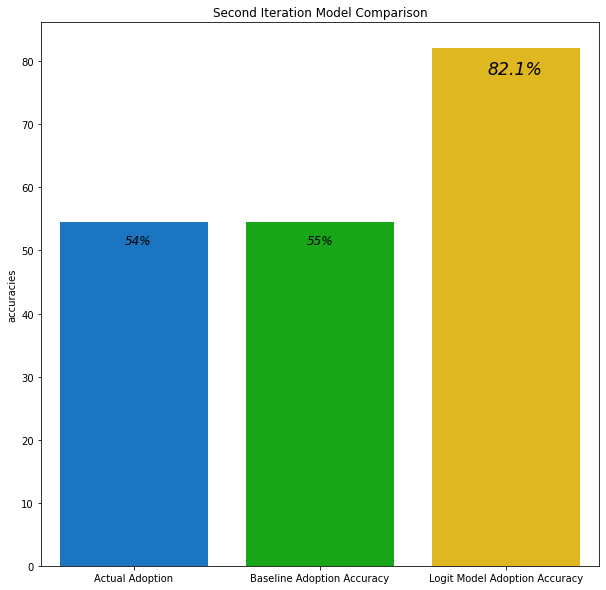

In [78]:

f, ax = plt.subplots(figsize=(10, 10)) 
sns.barplot(x=accdf.index, y="accuracies", data = accdf, palette='nipy_spectral')

ax.text(1.90, 78, '82.1%', style='italic', size='xx-large')
ax.text(0.93, 51, '55%', style='italic', size='large')
ax.text(-0.05, 51, '54%', style='italic', size='large')

plt.title("Second Iteration Model Comparison")
